<a href="https://colab.research.google.com/github/luislucianozurdogmailcom/PREDICCION_DE_LA_PROPAGACION_DE_DENGUE/blob/main/Entrega_Proyecto.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **PREDICCIÓN DE LA PROPAGACIÓN DE DENGUE**

## **Proyecto final de Data Science - Coderhouse**

 ### **Introducción**

 La fiebre del dengue es una enfermedad transmitida por mosquitos que se presenta en partes tropicales y subtropicales del mundo. En los casos leves, los síntomas son similares a los de la gripe: fiebre, sarpullido y dolor muscular y articular. En casos severos, la fiebre del dengue puede causar sangrado severo, presión arterial baja e incluso la muerte.

Debido a que es transportado por mosquitos, la dinámica de transmisión del dengue está relacionada con variables climáticas como la temperatura y la precipitación. Aunque la relación con el clima es compleja, un número creciente de científicos argumentan que es probable que el cambio climático produzca cambios en la distribución que tendrán importantes implicaciones para la salud pública en todo el mundo .

En los últimos años la fiebre del dengue se ha ido propagando. Históricamente, la enfermedad ha sido más frecuente en el sudeste de Asia y las islas del Pacífico. En estos días, muchos de los casi 500 millones de casos por año están ocurriendo en América Latina.

### **Problema a resolver y objetivo**

Con los datos ambientales recopilados por varias agencias del gobierno federal de los EE. UU., desde los Centros para el Control y la Prevención de Enfermedades hasta la Administración Nacional Oceánica y Atmosférica del Departamento de Comercio de los EE. UU, se buscará predecir la cantidad de casos de dengue cada semana (en cada ubicación) en función de las variables ambientales que describen los cambios de temperatura, precipitación, vegetación y más.

### **Integrantes** 
 * Joaquín Saharrea
 * Virginia Marich
 * Luciano Zurdo
 * Milagros Salvatierra


**Fuente:** https://www.drivendata.org/competitions/44/dengai-predicting-disease-spread/data/ 

# DESARROLLO DEL PROYECTO



*Importación de librerias*

In [1]:
#Librerias genericas para el tratamiento de datos
import pandas as pd
import numpy as np
import datetime
import missingno as msno 
import pandas_profiling 
import math
from math import sqrt
from pandas_profiling import ProfileReport
from google.colab import files


#Librerias gráficas
import matplotlib.pyplot as plt
import seaborn as sns
import pylab
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

plt.rcParams["figure.figsize"] = (7, 7)

#Librerias de Machine Learning
import scipy
from scipy import stats
import sklearn
from scipy.stats import shapiro
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_tweedie_deviance
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
from sklearn import tree
from sklearn import preprocessing 



*Data Acquisition*

In [2]:
files.upload()
df=pd.read_csv('dengue_data.csv') # Data set de caracteristicas climaticas df:data features
dc=pd.read_csv('dengue_cases.csv') # Data set de casos de dengue por ciudad y año dc: data cases

Saving dengue_cases.csv to dengue_cases.csv
Saving dengue_data.csv to dengue_data.csv


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

## Analisis de datasets

**Existen dos data set:** 


*   Data set caracteristicas climáticas - df - data features
*   Data set casos de dengue - dc - data cases




> **DATA FEATURES**



In [3]:
df.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


In [4]:
df.columns

Index(['city', 'year', 'weekofyear', 'week_start_date', 'ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm'],
      dtype='object')

*Referencias de variables*

* city: ciudades - en el data set figuran como 'sj' y 'iq', refiriendose a "San Juan, Puerto Rico" y por otro lado "Iquito, Peru". 

* ndvi: indice de vegetación - ne: noreste, nw: noroeste, se: sudeste, sw: sudoeste. NDVI siempre varía de -1 a +1. Por ejemplo, cuando tienes valores negativos, es muy probable que sea agua. Por otro lado, si tiene un valor NDVI cercano a +1, existe una alta posibilidad de que se trate de hojas verdes densas. Pero cuando NDVI está cerca de cero, no hay hojas verdes e incluso podría ser un área urbanizada.

* dew_point: punto de rocío. Cuanto mayor sea el punto de rocío, mayor será la cantidad de humedad en el aire.

* reanalysis: reanálisis del clima es un método científico para desarrollar un registro completo de cómo el tiempo y el clima están cambiando con el tiempo. En él, las observaciones y un modelo se combinan para generar una estimación de parametros.  

* tdtr: rango de temperatura diurna. 

* station: se refiere a las mediciones dadas por el modelo de estación, se llama modelo de estación porque muestra el clima medido en una estación meteorológica en particular, o un área donde se mide el clima. 



In [5]:
print('Este data set tiene ' + str(df.shape[0]) + ' filas, y ' + str(df.shape[1]) + ' columnas.')

Este data set tiene 1456 filas, y 24 columnas.


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 24 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   1456 non-null   object 
 1   year                                   1456 non-null   int64  
 2   weekofyear                             1456 non-null   int64  
 3   week_start_date                        1456 non-null   object 
 4   ndvi_ne                                1262 non-null   float64
 5   ndvi_nw                                1404 non-null   float64
 6   ndvi_se                                1434 non-null   float64
 7   ndvi_sw                                1434 non-null   float64
 8   precipitation_amt_mm                   1443 non-null   float64
 9   reanalysis_air_temp_k                  1446 non-null   float64
 10  reanalysis_avg_temp_k                  1446 non-null   float64
 11  rean

**¿Cuantas ciudades diferentes hay en el dataset?**

In [7]:
print("Ciudades analizadas: ", len(df['city'].unique().tolist()))

Ciudades analizadas:  2


**Para mayor claridad, se reemplazan las iniciales por el nombre de las ciudades**

In [8]:
df.replace("sj", "San Juan, PR", inplace=True)
df.replace("iq","Iquito, PE", inplace=True)

In [9]:
df.groupby('city').describe()

year                                                           \
              count         mean       std     min      25%     50%      75%   
city                                                                           
Iquito, PE    520.0  2005.000000  2.918283  2000.0  2002.75  2005.0  2007.25   
San Juan, PR  936.0  1998.826923  5.212076  1990.0  1994.00  1999.0  2003.00   

                     weekofyear             ... station_min_temp_c        \
                 max      count       mean  ...                75%   max   
city                                        ...                            
Iquito, PE    2010.0      520.0  26.503846  ...               22.0  24.2   
San Juan, PR  2008.0      936.0  26.503205  ...               23.9  25.6   

             station_precip_mm                                            \
                         count       mean        std  min     25%    50%   
city                                                                       
Iquito, PE               504.0  62.467262  63.245958  0.0  17.200  45.30   
San Juan, PR             930.0  26.785484  29.325811  0.0   6.825  17.75   

                            
                75%    max  
city                        
Iquito, PE    85.95  543.3  
San Juan, PR  35.45  305.9  

[2 rows x 176 columns]

**Rango de tiempo en el que se realiza el analisis**

In [10]:
años=df['year'].unique().tolist()

In [11]:
print("Existen datos recabados desde", min(años), "hasta", max(años), "en este data set.")

Existen datos recabados desde 1990 hasta 2010 en este data set.


In [12]:
type(df)

pandas.core.frame.DataFrame



> **DATA CASES**



In [13]:
dc.head()
dc

,city,year,weekofyear,total_cases
0,sj,1990,18,4
1,sj,1990,19,5
2,sj,1990,20,4
3,sj,1990,21,3
4,sj,1990,22,6
...,...,...,...,...
1451,iq,2010,21,5
1452,iq,2010,22,8
1453,iq,2010,23,1
1454,iq,2010,24,1


In [14]:
dc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   city         1456 non-null   object
 1   year         1456 non-null   int64 
 2   weekofyear   1456 non-null   int64 
 3   total_cases  1456 non-null   int64 
dtypes: int64(3), object(1)
memory usage: 45.6+ KB


In [15]:
dc.duplicated().sum()

0

In [16]:
dc.replace("sj", "San Juan, PR", inplace=True)
dc.replace("iq","Iquito, PE", inplace=True)

dc2=dc['total_cases']

## *Data Wrangling*

In [354]:
df.duplicated().sum()

0

In [355]:
df.isnull().sum()

city                                     0
year                                     0
weekofyear                               0
week_start_date                          0
ndvi_ne                                  0
ndvi_nw                                  0
ndvi_se                                  0
ndvi_sw                                  0
precipitation_amt_mm                     0
reanalysis_air_temp_k                    0
reanalysis_avg_temp_k                    0
reanalysis_dew_point_temp_k              0
reanalysis_max_air_temp_k                0
reanalysis_min_air_temp_k                0
reanalysis_precip_amt_kg_per_m2          0
reanalysis_relative_humidity_percent     0
reanalysis_sat_precip_amt_mm             0
reanalysis_specific_humidity_g_per_kg    0
reanalysis_tdtr_k                        0
station_avg_temp_c                       0
station_diur_temp_rng_c                  0
station_max_temp_c                       0
station_min_temp_c                       0
station_pre

**OBSERVACIÓN: Se detectan datos faltantes en varias columnas - se debe proceder al tratamiento de los mismos previo a un análisis**



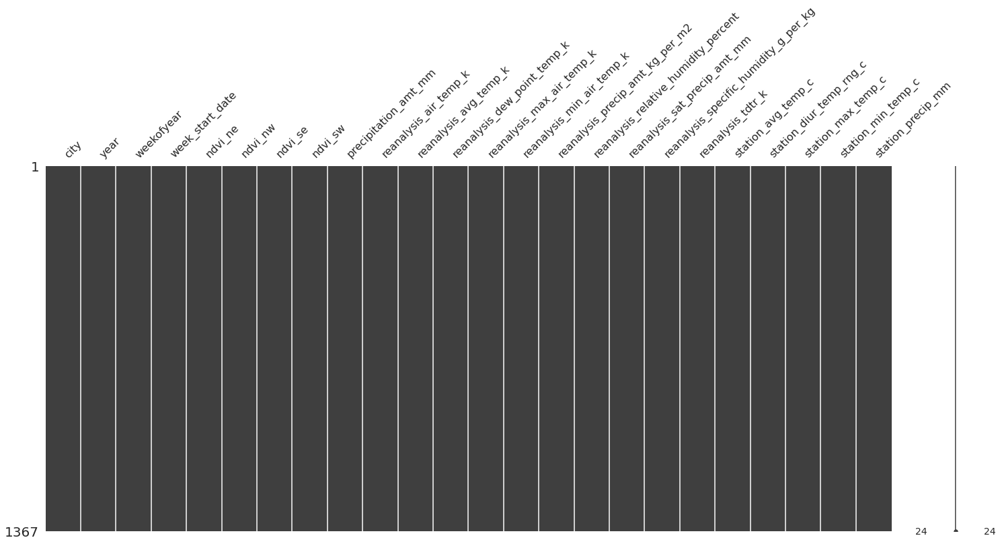

In [356]:
#Observando la distribución de datos faltantes 

%matplotlib inline
msno.matrix(df)

In [357]:
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [358]:
df_missing= missing_values_table(df)
df_missing

Your selected dataframe has 24 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


**OBSERVACION**: *ndvi* contiene más del 13.3% de sus datos faltantes. Se debe estudiar su relación con otras variables para definir el método de tratamiento más apropiado. 

In [359]:
df.corr()

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
year,1.000000,-0.062281,0.176573,0.127911,0.228764,0.273008,0.204246,-0.132082,0.087959,0.137556,...,0.130551,0.333829,0.204246,0.166050,0.480281,0.041519,0.366488,0.224762,-0.204900,0.218853
weekofyear,-0.062281,1.000000,0.041412,0.039944,0.105243,0.053587,0.119955,0.433808,0.476787,0.363070,...,0.071446,-0.006408,0.119955,0.365340,0.088060,0.369704,0.030673,0.237469,0.298394,0.077645
ndvi_ne,0.176573,0.041412,1.000000,0.860026,0.588949,0.646454,0.195373,-0.331578,-0.041287,0.064797,...,0.195562,0.468399,0.195373,0.101501,0.664204,0.185209,0.651103,0.477356,-0.292921,0.238651
ndvi_nw,0.127911,0.039944,0.860026,1.000000,0.548964,0.642402,0.190785,-0.317632,-0.035965,0.075619,...,0.192708,0.463780,0.190785,0.111955,0.639220,0.197448,0.647532,0.482958,-0.290715,0.220440
ndvi_se,0.228764,0.105243,0.588949,0.548964,1.000000,0.820803,0.071966,-0.159810,0.047987,0.008340,...,0.031201,0.222917,0.071966,0.033767,0.483373,0.086597,0.452058,0.285175,-0.247834,0.135727
ndvi_sw,0.273008,0.053587,0.646454,0.642402,0.820803,1.000000,0.119564,-0.229124,0.019216,0.023554,...,0.096602,0.316791,0.119564,0.055837,0.571170,0.118085,0.550800,0.376316,-0.292510,0.164156
precipitation_amt_mm,0.204246,0.119955,0.195373,0.190785,0.071966,0.119564,1.000000,-0.022372,0.104986,0.424261,...,0.475914,0.498675,1.000000,0.440543,0.220206,0.223164,0.197330,0.301119,0.067822,0.489086
reanalysis_air_temp_k,-0.132082,0.433808,-0.331578,-0.317632,-0.159810,-0.229124,-0.022372,1.000000,0.902116,0.540140,...,-0.136716,-0.394098,-0.022372,0.518209,-0.280267,0.618356,-0.269213,0.225186,0.728534,-0.180649
reanalysis_avg_temp_k,0.087959,0.476787,-0.041287,-0.035965,0.047987,0.019216,0.104986,0.902116,1.000000,0.632439,...,-0.037020,-0.151735,0.104986,0.629817,0.125391,0.751730,0.099615,0.510747,0.593273,-0.050595
reanalysis_dew_point_temp_k,0.137556,0.363070,0.064797,0.075619,0.008340,0.023554,0.424261,0.540140,0.632439,1.000000,...,0.423168,0.551561,0.424261,0.997058,-0.004494,0.747646,0.040488,0.508110,0.650704,0.240824


**En base a la correlación lineal al realizar df.corr() se adopta el criterio de rellenar los valores faltantes de ndvi_ne de acuerdo a la correlacion con ndvi_nw (coef=0.85), en el caso de que ndvi_nw no exista al mismo tiempo, se busca la siguiente correlacion de variable con ndvi_ne (si esos son los menores casos y no es un % significativo, eliminar el faltante).**

In [360]:
print('Correlación Pearson: ', df['ndvi_ne'].corr(df['ndvi_nw'], method='pearson'))
print('Correlación spearman: ', df['ndvi_ne'].corr(df['ndvi_nw'], method='spearman'))
print('Correlación kendall: ', df['ndvi_ne'].corr(df['ndvi_nw'], method='kendall'))

Correlación Pearson:  0.8600255572367079
Correlación spearman:  0.883673478250879
Correlación kendall:  0.7152666167257902


La correlación de Pearson funciona bien con variables cuantitativas que tienen una distribución normal o próxima a la normal. Es más sensible a los valores extremos que las otras dos alternativas.

La correlación de Spearman se emplea con variables cuantitativas (continuas o discretas). En lugar de utilizar directamente el valor de cada variable, los datos son ordenados y reemplazados por su respectivo orden ranking. Es un método no paramétrico muy utilizado cuando no se satisface la condición de normalidad necesaria para aplicar la correlación de Pearson.

La correlación de Kendall es otra alternativa no paramétrica que, al igual que la correlación de Spearman, utiliza la ordenación de las observaciones ranking. Es recomendable cuando se dispone de pocos datos y muchos de ellos ocupan la misma posición en el rango, es decir, cuando hay muchas ligaduras.

**VERIFICACION DE NORMALIDAD**

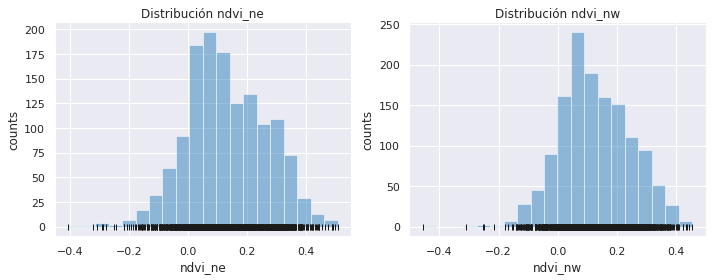

In [361]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axs[0].hist(x=df.ndvi_ne, bins=20, color="#3182bd", alpha=0.5)
axs[0].plot(df.ndvi_ne, np.full_like(df.ndvi_ne, -0.01), '|k', markeredgewidth=1)
axs[0].set_title('Distribución ndvi_ne')
axs[0].set_xlabel('ndvi_ne')
axs[0].set_ylabel('counts')

axs[1].hist(x=df.ndvi_nw, bins=20, color="#3182bd", alpha=0.5)
axs[1].plot(df.ndvi_nw, np.full_like(df.ndvi_nw, -0.01), '|k', markeredgewidth=1)
axs[1].set_title('Distribución ndvi_nw')
axs[1].set_xlabel('ndvi_nw')
axs[1].set_ylabel('counts')


plt.tight_layout();

*Si bien se observa una distribucion normal de las variables, utilizar el metodo de Pearson para determinar la significancia estadistica no es posible, porque no acepta valores NAN*

In [362]:
r, p = stats.spearmanr(df['ndvi_ne'], df['ndvi_nw'],nan_policy='omit') 
print(f"Correlación Spearman: r={r}, p-value={p}")

Correlación Spearman: r=0.883673478250879, p-value=0.0


* Los test estadísticos muestran una correlación lineal entre moderada y alta, con claras evidencias estadísticas de que la relación observada no se debe al azar ( pvalue≈0 ).

**Objetivo: obtener los valores de intercepto y pendiente de la función de correlación entre ndvi_ne y ndvi_nw, asi luego hacer fill na condicionado por esa función.**

In [363]:
# El modelo no permite el calculo con valores NAN, por lo que se realiza una copia del data frame omitiendo los valores nulos. 

df2=df.dropna()
result = scipy.stats.linregress(df2['ndvi_nw'], df2['ndvi_ne'])

print("El coeficiente de correlación entre ndvi_ne y ndvi_nw es", result.rvalue)
print("La pendiente de la recta es:", result.slope)
print("El intercepto de la recta es:", result.intercept)
# En una línea de regresión, cuanto menor es el error estándar de la estimación, más precisas son las predicciones.
print ("El error estandar es: ", result.stderr)

El coeficiente de correlación entre ndvi_ne y ndvi_nw es 0.8600255572367081
La pendiente de la recta es: 0.9832157005098313
El intercepto de la recta es: 0.007608827040175875
El error estandar es:  0.015789011876422288


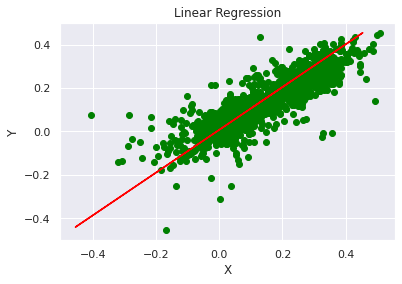

In [364]:
a=result.slope
b=result.intercept
x=df2['ndvi_nw']
y= result.slope*x +b 

plt.scatter(df2['ndvi_ne'],df2['ndvi_nw'],color="green")
plt.plot(x,y,color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.title("Linear Regression")
plt.show()

**HACEMOS REEMPLAZO DE LOS DATOS FALTANTES POR LA ECUACION DE CORRELACION CON NDVI_NW**

In [365]:
df["ndvi_ne"] = df["ndvi_ne"].fillna(df['ndvi_nw']*result.slope+result.intercept)

#Hacemos lo mismo para los NANS de ndvi_nw


df["ndvi_nw"]=df["ndvi_nw"].fillna((df['ndvi_ne']-result.intercept)/result.slope)


In [366]:
df_missing= missing_values_table(df)
df_missing

Your selected dataframe has 24 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


**Dado el bajo % de representacion de valores NAN respecto al total, se decide eliminarlos**



In [367]:
df=df.dropna()

*Analisis de data set de casos (dc)*

**Union de data sets**

In [368]:
data=pd.concat([df,dc2], axis = 1)
data.dropna()




,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,"San Juan, PR",1990.0,18.0,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1,"San Juan, PR",1990.0,19.0,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
2,"San Juan, PR",1990.0,20.0,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
3,"San Juan, PR",1990.0,21.0,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
4,"San Juan, PR",1990.0,22.0,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,"Iquito, PE",2010.0,21.0,2010-05-28,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,...,88.765714,55.30,18.485714,9.800000,28.633333,11.933333,35.4,22.4,27.0,5
1452,"Iquito, PE",2010.0,22.0,2010-06-04,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,...,91.600000,86.47,18.070000,7.471429,27.433333,10.500000,34.7,21.7,36.6,8
1453,"Iquito, PE",2010.0,23.0,2010-06-11,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,...,94.280000,58.94,17.008571,7.500000,24.400000,6.900000,32.2,19.2,7.4,1
1454,"Iquito, PE",2010.0,24.0,2010-06-18,0.333914,0.245771,0.278886,0.325486,59.67,296.345714,...,94.660000,59.67,16.815714,7.871429,25.433333,8.733333,31.2,21.0,16.0,1


## Análisis univariado

Primero revisamos los tipos de datos que tenemos en el dataset

In [369]:
for i in data.columns:
  print('Para la columna "',i,'" el tipo de dato asociado es ',data[i].dtype)

Para la columna " city " el tipo de dato asociado es  object
Para la columna " year " el tipo de dato asociado es  float64
Para la columna " weekofyear " el tipo de dato asociado es  float64
Para la columna " week_start_date " el tipo de dato asociado es  object
Para la columna " ndvi_ne " el tipo de dato asociado es  float64
Para la columna " ndvi_nw " el tipo de dato asociado es  float64
Para la columna " ndvi_se " el tipo de dato asociado es  float64
Para la columna " ndvi_sw " el tipo de dato asociado es  float64
Para la columna " precipitation_amt_mm " el tipo de dato asociado es  float64
Para la columna " reanalysis_air_temp_k " el tipo de dato asociado es  float64
Para la columna " reanalysis_avg_temp_k " el tipo de dato asociado es  float64
Para la columna " reanalysis_dew_point_temp_k " el tipo de dato asociado es  float64
Para la columna " reanalysis_max_air_temp_k " el tipo de dato asociado es  float64
Para la columna " reanalysis_min_air_temp_k " el tipo de dato asociado es

Como tenemos columnas de tipo object pasamos las numericas a numeros

In [370]:
data['year']                                  = pd.to_numeric(data['year']);
data['weekofyear']                            = pd.to_numeric(data['weekofyear']);
data['week_start_date']                       = pd.to_datetime(data['week_start_date']);
data['ndvi_ne']                               = pd.to_numeric(data['ndvi_ne']);
data['ndvi_nw']                               = pd.to_numeric(data['ndvi_nw']);
data['ndvi_se']                               = pd.to_numeric(data['ndvi_se']);
data['ndvi_sw']                               = pd.to_numeric(data['ndvi_sw']);
data['precipitation_amt_mm']                  = pd.to_numeric(data['precipitation_amt_mm']);
data['reanalysis_air_temp_k']                 = pd.to_numeric(data['reanalysis_air_temp_k']);
data['reanalysis_avg_temp_k']                 = pd.to_numeric(data['reanalysis_avg_temp_k']);
data['reanalysis_dew_point_temp_k']           = pd.to_numeric(data['reanalysis_dew_point_temp_k']);
data['reanalysis_max_air_temp_k']             = pd.to_numeric(data['reanalysis_max_air_temp_k']);
data['reanalysis_min_air_temp_k']             = pd.to_numeric(data['reanalysis_min_air_temp_k']);
data['reanalysis_precip_amt_kg_per_m2']       = pd.to_numeric(data['reanalysis_precip_amt_kg_per_m2']);
data['reanalysis_relative_humidity_percent']  = pd.to_numeric(data['reanalysis_relative_humidity_percent']);
data['reanalysis_specific_humidity_g_per_kg'] = pd.to_numeric(data['reanalysis_relative_humidity_percent']);
data['reanalysis_tdtr_k']                     = pd.to_numeric(data['reanalysis_tdtr_k']);
data['station_avg_temp_c']                    = pd.to_numeric(data['station_avg_temp_c']);
data['station_diur_temp_rng_c']               = pd.to_numeric(data['station_diur_temp_rng_c']);
data['station_max_temp_c']                    = pd.to_numeric(data['station_max_temp_c']);
data['station_min_temp_c']                    = pd.to_numeric(data['station_min_temp_c']);
data['station_precip_mm']                     = pd.to_numeric(data['station_precip_mm']);
data['total_cases']                           = pd.to_numeric(data['total_cases']);



### > **Analisis de variables categoricas**




In [371]:
data.city.value_counts()

San Juan, PR    895
Iquito, PE      472
Name: city, dtype: int64

*Se tiene un mayor registro de datos de casos de dengue en San Juan, Puerto Rico*

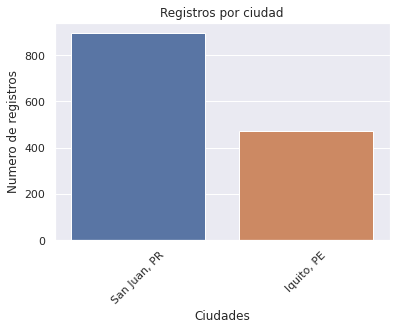

In [372]:

sns.set_theme(style="darkgrid")
sns.countplot(data=data, x='city')

plt.title('Registros por ciudad')
plt.ylabel('Numero de registros')
plt.xlabel('Ciudades')
plt.xticks(rotation = 45)
plt.show();

### > **Analisis de variables numéricas**

**Hacemos el gráfico de violin para todas las variables numéricas**

In [373]:
for n,i in enumerate(data.drop(columns=['week_start_date','total_cases'])):
  fig = px.violin(data, x=[i],box=True);
  fig.show()

## Análisis Bivariado

**Analisis de casos por ciudad**

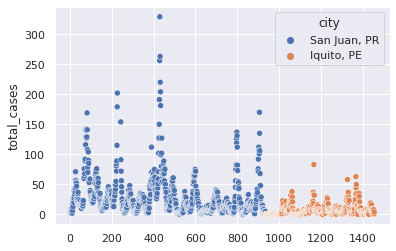

In [374]:
sns.scatterplot(x=data.index, y=data["total_cases"], hue=data["city"])

*Observación: mayor cantidad de casos en San Juan Puerto Rico*

**Analisis de casos por año**

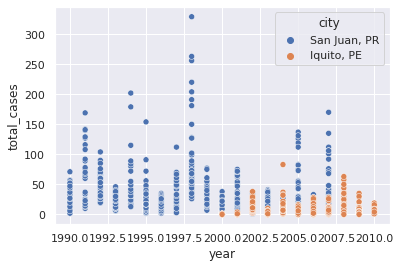

In [375]:
sns.scatterplot(x=data.year, y=data["total_cases"], hue=data["city"])

**Observacion: no hay un patron claro de aumento o disminución en el tiempo, si se observa que alrededor del año 1997 hubo un pico de casos. En 2007 se dio casi la misma cantidad de casos que en 1991.**

**Graficamos todas las variables en función de la variable que intentamos predecir**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning

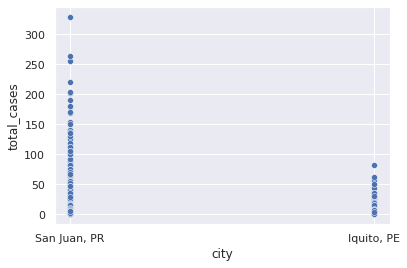

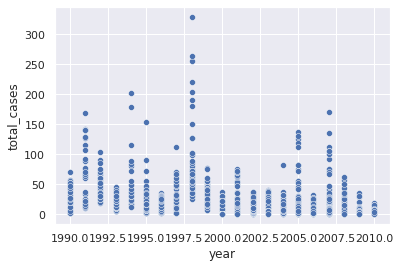

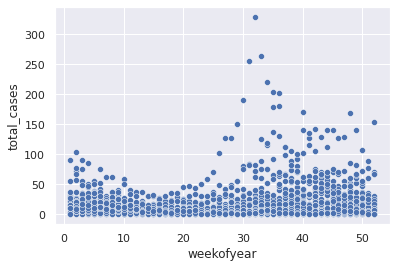

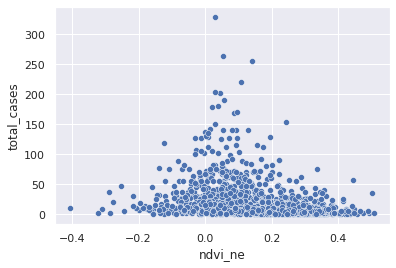

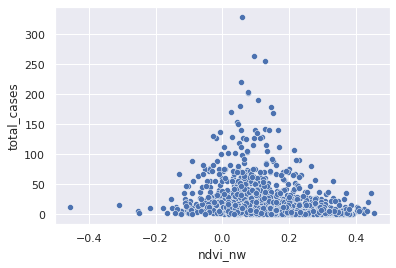

...

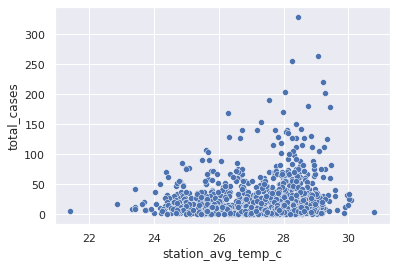

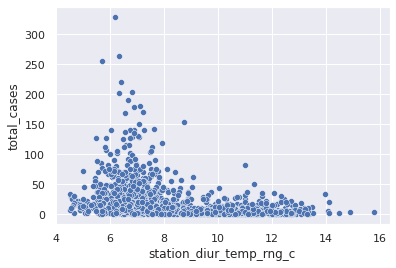

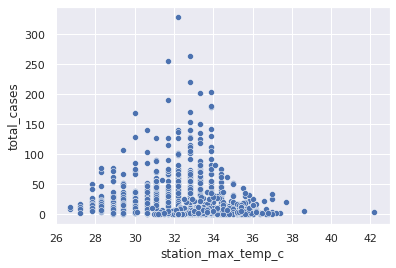

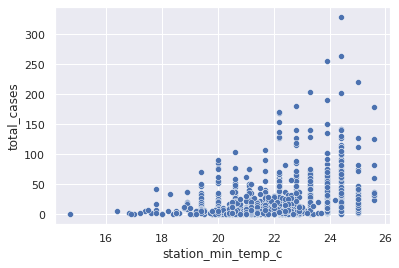

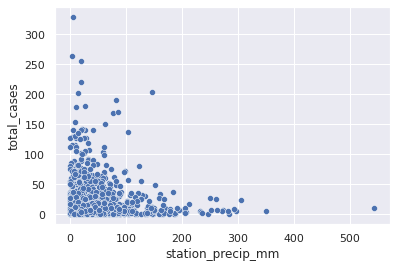

In [376]:
for n,i in enumerate(data.drop(columns=['total_cases','week_start_date']).columns):
  try:
    plt.figure(n)
    sns.scatterplot(data[i], data['total_cases'])
  
  except:
    print('error')

**OBSERVACIONES**


1. Total de casos por año


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



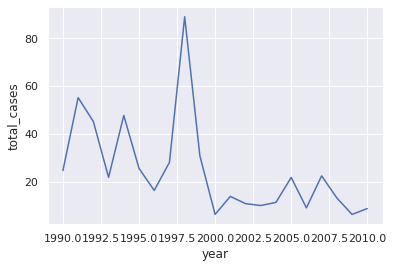

In [377]:
data1=data.groupby(data['year']).mean()

sns.lineplot(data1.index, data1['total_cases'])

> **En cuanto al avance de casos en el tiempo, si se saca un promedio de casos por año se encuentra un evidente descenso de los mismos en el tiempo, con un pico de casos en el año 1997.**







2. Total de casos por semana del año

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



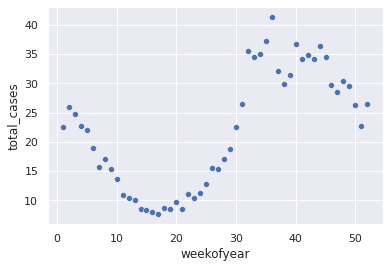

In [378]:
data2=data.groupby(data['weekofyear']).mean()

sns.scatterplot(data2.index, data2['total_cases'])





> **Se puede observar un aumento de casos entre la semana 30 y 40 del año. Correspondiendo entre los meses de Julio y Octubre.**




3. Total de casos en función del indice de vegetacion (ndvi)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



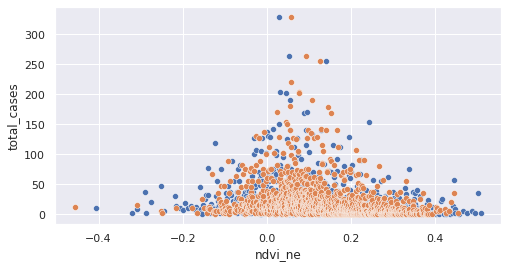

In [379]:
data2=data.groupby(data['ndvi_ne']).mean()
data3=data.groupby(data['ndvi_nw']).mean()
sns.set(rc={"figure.figsize":(8, 4)})

sns.scatterplot(data2.index, data2['total_cases'])
sns.scatterplot(data3.index, data3['total_cases'])



> **Respecto a los casos en relacion a los indices de vegetacion, se observa que mientras mas cerca de cero y valores negativos (zonas con agua y urbanizadas) mayor cantidad de casos.**



4. Total de casos en funcion de la precipitación. 

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



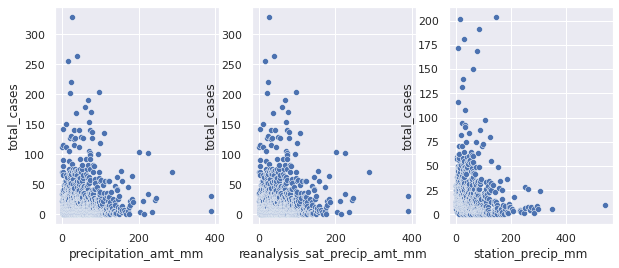

In [380]:
data2=data.groupby(data['precipitation_amt_mm']).mean()
data3=data.groupby(data['reanalysis_sat_precip_amt_mm']).mean()
data4=data.groupby(data['station_precip_mm']).mean()

sns.set(rc={"figure.figsize":(10, 4)})
fig, axs = plt.subplots(ncols=3)
sns.scatterplot(data2.index, data2['total_cases'], ax=axs[0])
sns.scatterplot(data3.index, data3['total_cases'], ax=axs[1])
sns.scatterplot(data4.index, data4['total_cases'], ax=axs[2])

**Para las distintas mediciones que se tienen de la precipitacion en mm con respecto al total de casos, se puede sacar la misma conclusion: a menor precipitacion mayor aumento de casos.**

5. Total de casos respecto a mediciones de temperatura promedio.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



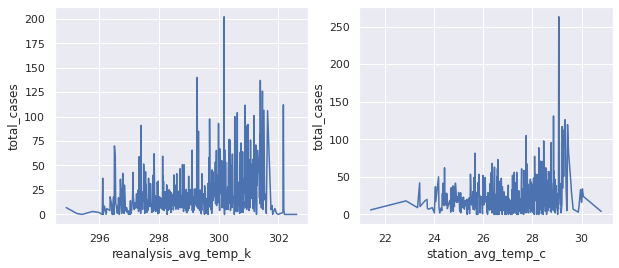

In [381]:
data2=data.groupby(data['reanalysis_avg_temp_k']).mean()
data3=data.groupby(data['station_avg_temp_c']).mean()

ig, axs = plt.subplots(ncols=2)
sns.lineplot(data2.index, data2['total_cases'], ax=axs[0])
sns.lineplot(data3.index, data3['total_cases'], ax=axs[1])

**Para ambas mediciones de la temperatura promedio (avg) se observa un aumento de casos a mayores temperaturas.**

## Análisis Multivariado

**Vamos a hacer un análisis multivariado tomando varios features y llevarlos a columnas o dimensiones para poder graficarlos en un tipo de gráfico plano**

In [45]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

pca=PCA()
scaler = StandardScaler()
data_no_nans   = data.dropna();
data_ndvi = data_no_nans[['ndvi_ne','ndvi_nw','ndvi_se','ndvi_sw']];


segmentation_std = scaler.fit_transform(data_ndvi)
pca.fit(segmentation_std)

PCA()

In [46]:
# The attribute shows how much variance is explained by each of the seven individual components.
pca.explained_variance_ratio_

array([0.76376065, 0.15841617, 0.04469045, 0.03313273])

ndvi_ne explica el 76% de la variabilidad de los datos y ndvi_nw casi el 16%. Siendo estos dos los que explican la mayoria, son los que seleccionaremos para continuar el analisis.

Text(0, 0.5, 'Cumulative Explained Variance')

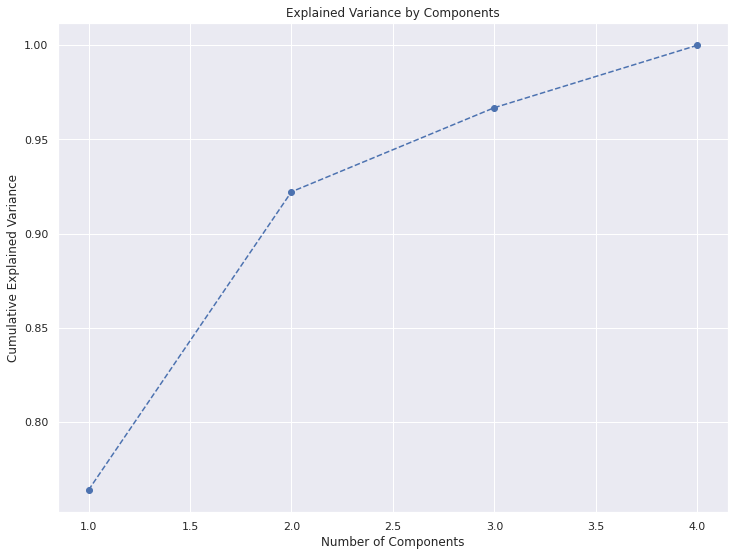

In [47]:
plt.figure(figsize = (12,9))
plt.plot(range(1,5), pca.explained_variance_ratio_.cumsum(), marker = 'o', linestyle = '--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

Esta grafica nos muestra que si elegimos dos componentes ya se representa más del 90% de la variabilidad de los datos. 

In [48]:
pca=PCA(n_components=2)
pca.fit(segmentation_std)

PCA(n_components=2)

In [49]:
pca.components_

array([[ 0.50777703,  0.50045191,  0.48245518,  0.50886872],
       [-0.46566928, -0.51640506,  0.58397046,  0.4188752 ]])

In [50]:
df_pca_comp = pd.DataFrame(data = pca.components_,
                           columns = data_ndvi.columns.values,
                           index = ['Component 1', 'Component 2'])
df_pca_comp

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw
Component 1,0.507777,0.500452,0.482455,0.508869
Component 2,-0.465669,-0.516405,0.583970,0.418875


([<matplotlib.axis.YTick at 0x7f56f8e80290>,
 [Text(0, 0.5, 'Component 1'), Text(0, 1.5, 'Component 2')])

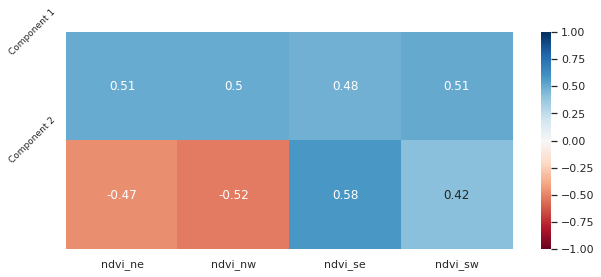

In [51]:
sns.heatmap(df_pca_comp, 
            vmin=-1,
            vmax=1,
            cmap='RdBu',
            annot= True)

plt.yticks([0,1],
           ['Component 1', 'Component 2'],
           rotation=45,
           fontsize=9)

Para el componente 1 hay una correlacion positiva con casi todos los indices de vegetacion, siendo para el componente 2 negativa para los indices de vegetacion del norte y positiva para los indices de vegatcion del sur. 

Nuestros datos son de 4 dimensiones, debemos transformarlo en bidimensional, por eso el método .transform lo va a reducir en columnas.

In [52]:
pca.transform(segmentation_std)

array([[-0.29504543, -0.02405733],
       [-0.33149613, -0.75129197],
       [-0.65452176, -0.37887986],
       ...,
       [ 1.03006729,  0.06468356],
       [ 2.51988312,  0.02668968],
       [ 2.24311906,  0.11765958]])

In [53]:
scores_pca=pca.transform(segmentation_std)

In [54]:
data_cases    = data_no_nans['total_cases'];

# Preparamos el modelo de PCA (componentes principales)
pca             = PCA(n_components=2)
X_r             = scores_pca;
new_df          = pd.DataFrame();
new_df['Col_1'] = X_r[:,0];
new_df['Col_2'] = X_r[:,1];
new_df['Casos'] = data_cases;

Hacemos el gráfico con la primer columna calculada

Text(0, 0.5, 'Casos totales')

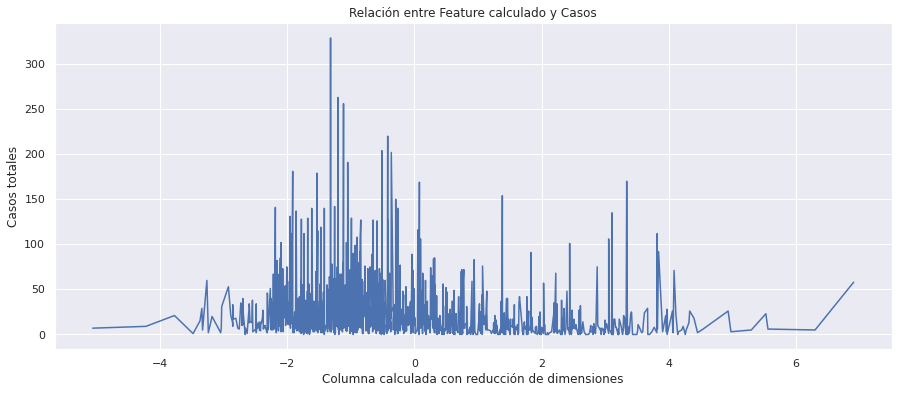

In [55]:
plt.subplots(figsize=(15,6))
grafico = sns.lineplot(data = new_df, x = 'Col_1', y = 'Casos')
grafico.set_title('Relación entre Feature calculado y Casos')
grafico.set_xlabel('Columna calculada con reducción de dimensiones')
grafico.set_ylabel('Casos totales')

**MAYOR CANTIDAD DE CASOS A MENOR VALOR O VALOR NEGATIVO DE LOS INDICES DE VEGETACION REDIMENSIONADOS EN LA COLUMNA 1, LA CUAL TIENE CORRELACION POSITIVA CON TODOS LOS INDICES DE VEGETACION, ESTO ES EN GENERAL A MENOR INDICE DE VEGETACION ES DECIR, ZONAS ACUIFERAS, MAYOR CASOS DE DENGUE.**

Hacemos el gráfico con la segunda columna calculada

Text(0, 0.5, 'Casos totales')

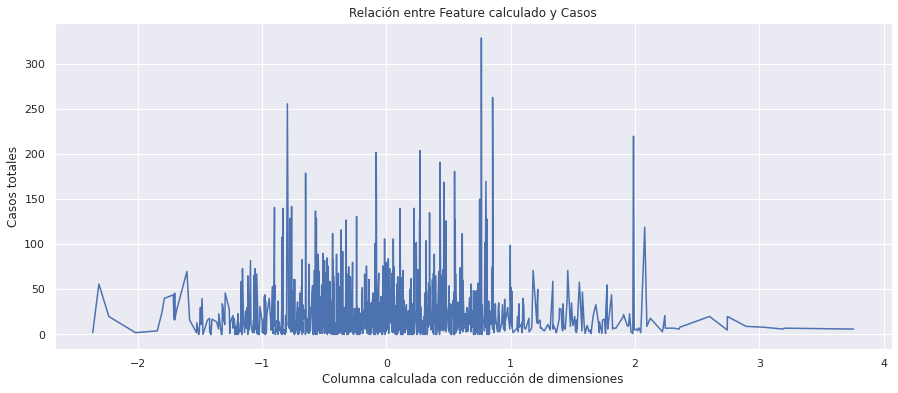

In [56]:
plt.subplots(figsize=(15,6))
grafico = sns.lineplot(data = new_df, x = 'Col_2', y = 'Casos')
grafico.set_title('Relación entre Feature calculado y Casos')
grafico.set_xlabel('Columna calculada con reducción de dimensiones')
grafico.set_ylabel('Casos totales')

**SE CONCENTRA LA MAYOR CANTIDAD DE CASOS AL TENER INDICE -1 Y 1 RESPECTIVAMENTE PARA LA REDIMENSION EN COLUMNA 2, LA CUAL TIENE CORRELACION POSITIVA CON LOS COMPONENTES DE VEGETACION DEL SUR, ESTO PODRIA HACER TENER UNA SUPOSICION QUE PARA LOS INDICES SW, SE, A MAYOR INDICE DE VEGETACION POSITIVA (ZONAS VERDES) Y NEGATIVA (ZONAS ACUIFERAS), MAYOR CANTIDAD DE CASOS.**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



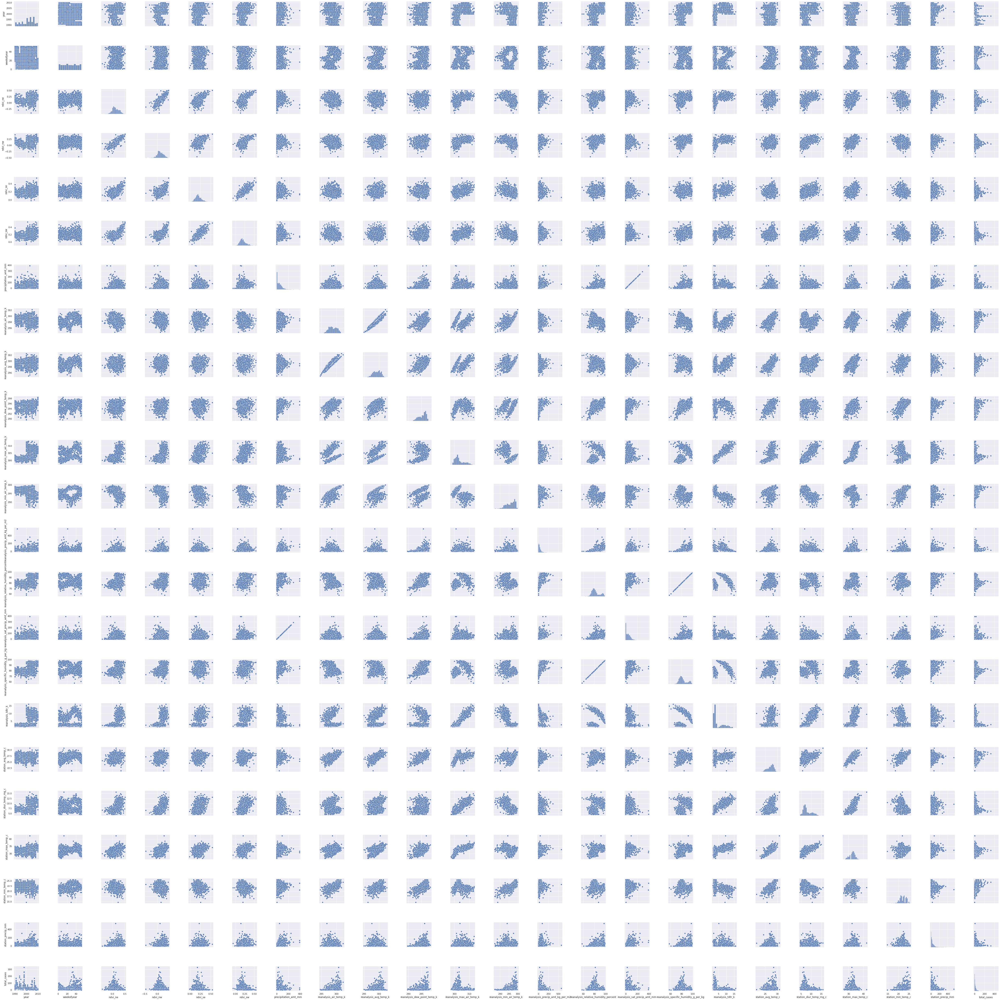

In [57]:
#Pairplot
sns.pairplot(data, size = 3 , palette = 'Set2')

## Ingenieria de Caracteristicas

Debido a que se trata de una serie de tiempo lo que tendremos que hacer es crear una serie de columnas correspondientes a su data historica, para poder crear la relación entre un dato pasado y otro.

Primero seteamos la columna de fecha como índice

In [382]:
data.set_index('week_start_date',inplace = True)

In [383]:
data

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
week_start_date,,,,,,,,,,,,,,,,,,,,,
1990-04-30,"San Juan, PR",1990.0,18.0,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,...,73.365714,12.42,73.365714,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1990-05-07,"San Juan, PR",1990.0,19.0,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,...,77.368571,22.82,77.368571,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
1990-05-14,"San Juan, PR",1990.0,20.0,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,...,82.052857,34.54,82.052857,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
1990-05-21,"San Juan, PR",1990.0,21.0,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,...,80.337143,15.36,80.337143,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
1990-05-28,"San Juan, PR",1990.0,22.0,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,...,80.460000,7.52,80.460000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-05-28,"Iquito, PE",2010.0,21.0,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,300.771429,...,88.765714,55.30,88.765714,9.800000,28.633333,11.933333,35.4,22.4,27.0,5
2010-06-04,"Iquito, PE",2010.0,22.0,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,299.392857,...,91.600000,86.47,91.600000,7.471429,27.433333,10.500000,34.7,21.7,36.6,8
2010-06-11,"Iquito, PE",2010.0,23.0,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,297.592857,...,94.280000,58.94,94.280000,7.500000,24.400000,6.900000,32.2,19.2,7.4,1


Para poder continuar tenemos que explicar brevemente el concepto de autocorrelación.

Al tener una serie de tiempo lo que tenemos es una serie (en donde **SI** importa el orden) que presenta una relación consigo misma a traves del tiempo, es decir que puede existir una correlación entre la serie de tiempo y la misma serie pero desfazada en el tiempo.

Es importante notar que en nuestra serie temporal la distancia temporal entre datos y datos es de una semana.

In [384]:
# Copiamos el dataset para no modificar el original
data_con_lags = data.copy()

Ahora vamos a crear los lags o retrazos en los datos, para eso vamos a elegir algunas columnas que tengan relevancia, por ejemplo no haremos lags de datos que no cambién como la ciudad o el año

In [385]:
data_con_lags.columns

Index(['city', 'year', 'weekofyear', 'ndvi_ne', 'ndvi_nw', 'ndvi_se',
       'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'total_cases'],
      dtype='object')

Seleccionamos las columnas de interes a aplicar estos lags o retrasos

In [386]:
columnas_de_interes = ['total_cases',
                       'station_precip_mm',
                       'station_min_temp_c',
                       'station_max_temp_c',
                       'station_avg_temp_c',
                       'reanalysis_specific_humidity_g_per_kg',
                       'precipitation_amt_mm',
                       'ndvi_nw',
                       'ndvi_ne',
                       'ndvi_se',
                       'ndvi_sw']

Creamos una función para fabricar los lags

In [387]:
def creadora_lags(dataframe,columnas,cantidad_lags):
  """
  La cantidad de lags para está función estará asociada a la cantidad de datos 
  no tomados desde un principio.
  """
  cantidad_lags += 1

  # Recortamos los datos
  df_resultado = dataframe.iloc[cantidad_lags:];
  largo_df     = len(dataframe);

  # Iteramos sobre las columnas
  for columna in columnas:
    
    for n in range(1,cantidad_lags):
    
      # Construimos las listas que serán las columnas lags
      df_resultado[columna + '_lag_' + str(n)] = [dato for dato in dataframe[columna].iloc[cantidad_lags - n : largo_df - n]]

  return df_resultado

Modificamos el dataframe con 8 lags debido a que cada lag representa una semana y el promedio de vida de un mosquito es de 56 dias u 8 semanas y siendo el mosquito el principal vector de propagación del dengue tendremos que tener en cuenta este tiempo.

In [388]:
data_con_lags = creadora_lags(data_con_lags,columnas_de_interes,8)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [389]:
data_con_lags

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,ndvi_se_lag_7,ndvi_se_lag_8,ndvi_sw_lag_1,ndvi_sw_lag_2,ndvi_sw_lag_3,ndvi_sw_lag_4,ndvi_sw_lag_5,ndvi_sw_lag_6,ndvi_sw_lag_7,ndvi_sw_lag_8
week_start_date,,,,,,,,,,,,,,,,,,,,,
1990-07-02,"San Juan, PR",1990.0,27.0,0.127119,0.121550,0.160683,0.202567,14.41,300.154286,300.278571,...,0.157200,0.162357,0.123600,0.133029,0.210271,0.181743,0.247340,0.235886,0.170843,0.155486
1990-07-09,"San Juan, PR",1990.0,28.0,0.192875,0.082350,0.191943,0.152929,22.27,299.512857,299.592857,...,0.227557,0.157200,0.202567,0.123600,0.133029,0.210271,0.181743,0.247340,0.235886,0.170843
1990-07-16,"San Juan, PR",1990.0,29.0,0.291600,0.211800,0.301200,0.280667,59.17,299.667143,299.750000,...,0.251200,0.227557,0.152929,0.202567,0.123600,0.133029,0.210271,0.181743,0.247340,0.235886
1990-07-23,"San Juan, PR",1990.0,30.0,0.150567,0.171700,0.226900,0.214557,16.48,299.558571,299.635714,...,0.254314,0.251200,0.280667,0.152929,0.202567,0.123600,0.133029,0.210271,0.181743,0.247340
1990-07-30,"San Juan, PR",1990.0,31.0,0.250611,0.247150,0.379700,0.381357,32.66,299.862857,299.950000,...,0.205071,0.254314,0.214557,0.280667,0.152929,0.202567,0.123600,0.133029,0.210271,0.181743
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-05-28,"Iquito, PE",2010.0,21.0,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,300.771429,...,NaN,0.250971,0.244500,0.145600,0.340286,0.307943,0.244400,0.135886,NaN,0.145243
2010-06-04,"Iquito, PE",2010.0,22.0,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,299.392857,...,0.184014,NaN,0.292514,0.244500,0.145600,0.340286,0.307943,0.244400,0.135886,NaN
2010-06-11,"Iquito, PE",2010.0,23.0,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,297.592857,...,0.331657,0.184014,0.225657,0.292514,0.244500,0.145600,0.340286,0.307943,0.244400,0.135886


# Algoritmos de clasificación

***Preparación del dataset***

In [390]:
data_con_lags = data_con_lags.drop(columns = ['weekofyear','year']);
data_con_lags = pd.get_dummies(data_con_lags, columns=["city"]);

In [391]:
data_con_lags

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,...,ndvi_sw_lag_1,ndvi_sw_lag_2,ndvi_sw_lag_3,ndvi_sw_lag_4,ndvi_sw_lag_5,ndvi_sw_lag_6,ndvi_sw_lag_7,ndvi_sw_lag_8,"city_Iquito, PE","city_San Juan, PR"
week_start_date,,,,,,,,,,,,,,,,,,,,,
1990-07-02,0.127119,0.121550,0.160683,0.202567,14.41,300.154286,300.278571,296.651429,302.3,298.7,...,0.123600,0.133029,0.210271,0.181743,0.247340,0.235886,0.170843,0.155486,0,1
1990-07-09,0.192875,0.082350,0.191943,0.152929,22.27,299.512857,299.592857,296.041429,301.8,298.0,...,0.202567,0.123600,0.133029,0.210271,0.181743,0.247340,0.235886,0.170843,0,1
1990-07-16,0.291600,0.211800,0.301200,0.280667,59.17,299.667143,299.750000,296.334286,302.0,297.3,...,0.152929,0.202567,0.123600,0.133029,0.210271,0.181743,0.247340,0.235886,0,1
1990-07-23,0.150567,0.171700,0.226900,0.214557,16.48,299.558571,299.635714,295.960000,301.8,297.1,...,0.280667,0.152929,0.202567,0.123600,0.133029,0.210271,0.181743,0.247340,0,1
1990-07-30,0.250611,0.247150,0.379700,0.381357,32.66,299.862857,299.950000,296.172857,303.0,298.3,...,0.214557,0.280667,0.152929,0.202567,0.123600,0.133029,0.210271,0.181743,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-05-28,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,300.771429,296.825714,309.7,294.5,...,0.244500,0.145600,0.340286,0.307943,0.244400,0.135886,NaN,0.145243,1,0
2010-06-04,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,299.392857,296.452857,308.5,291.9,...,0.292514,0.244500,0.145600,0.340286,0.307943,0.244400,0.135886,NaN,1,0
2010-06-11,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,297.592857,295.501429,305.5,292.4,...,0.225657,0.292514,0.244500,0.145600,0.340286,0.307943,0.244400,0.135886,1,0


In [392]:
data_con_lags = data_con_lags.dropna()

***Variables X e Y comunes a todos los modelos***

In [393]:
#VARIABLES
X = data_con_lags.drop('total_cases', axis=1)
y = data_con_lags.total_cases

## Arbol de Clasificación



> Dado el objetivo del proyecto predecir el total de casos de dengue en funcion de las caracteristicas climáticas, y, al ser esta una variable target de tipo númerica, se utiliza "DecisionTreeRegressor" al tratarse de un problema de regresion. 





 **Bloque de importación**





In [394]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
from sklearn.metrics import mean_squared_error
from sklearn.metrics import f1_score


**Entrenamos el modelo**

In [395]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, shuffle=False)



> *OBSERVACION: test_size=0.20 significa que 20% de los datos en el conjunto de prueba y el 80% para el entrenamiento.*




**Instanciamos el modelo con una profundidad de 2 y lo ajustamos**

In [396]:
tree = DecisionTreeRegressor(max_depth = 2,random_state = 123);
tree.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=2, random_state=123)

**Observamos lo que resulta del modelo**


In [397]:
y_pred_tree = tree.predict(X_test)

**Nos fijamos que tan bien predice nuestro modelo**

In [398]:
evaluation_tree=pd.DataFrame({'Actual':y_test, 'Predicted':y_pred_tree})
evaluation_tree

,Actual,Predicted
week_start_date,,
2002-07-23,5,10.806324
2002-07-30,6,10.806324
2002-08-06,7,10.806324
2002-08-13,7,10.806324
2002-10-22,25,38.556701
...,...,...
2010-03-26,9,10.806324
2010-04-02,4,10.806324
2010-06-11,1,10.806324


Profundidad del árbol: 2
Número de nodos terminales: 4


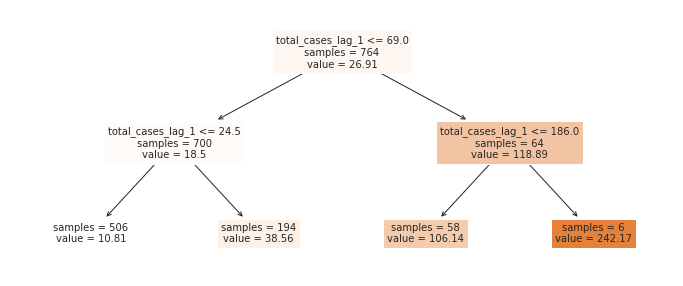

In [399]:
fig, ax = plt.subplots(figsize=(12, 5))

print(f"Profundidad del árbol: {tree.get_depth()}")
print(f"Número de nodos terminales: {tree.get_n_leaves()}")

plot = plot_tree(
            decision_tree = tree,
            feature_names = X_train.columns,
            class_names   = 'total_cases',
            filled        = True,
            impurity      = False,
            fontsize      = 10,
            precision     = 2,
            ax            = ax
       )

Metricas del modelo

In [400]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_tree))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_tree))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_tree)))

Mean Absolute Error: 7.367966119738505
Mean Squared Error: 92.5232736853425
Root Mean Squared Error: 9.618901896024436


In [401]:
print("Esto nos dice que la diferencia promedio entre el valor real de los datos y el valor predicho por el modelo es", metrics.mean_absolute_error(y_test, y_pred_tree),".")

Esto nos dice que la diferencia promedio entre el valor real de los datos y el valor predicho por el modelo es 7.367966119738505 .


**Instanciamos el modelo con una profundidad de 2-max y lo ajustamos.**

In [402]:
modelo_optimo         = [];
error_total           = [];
diff_error_train_test = [];

for i in range(1,12):

  modelo = DecisionTreeRegressor(max_depth = i,random_state = 123);
  modelo.fit(X_train, y_train);

  error_aux = mean_squared_error(modelo.predict(X_test),y_test);
  error_total.append(error_aux);
  diff_error_train_test.append(abs(error_aux - mean_squared_error(modelo.predict(X_train),y_train)));

  modelo_optimo.append(modelo);

Vamos a graficar para ver que profundidad de arbol nos ha dado el mejor valor de error y el mejor entrenamiento del modelo

Text(0, 0.5, 'Error cuadratico medio')

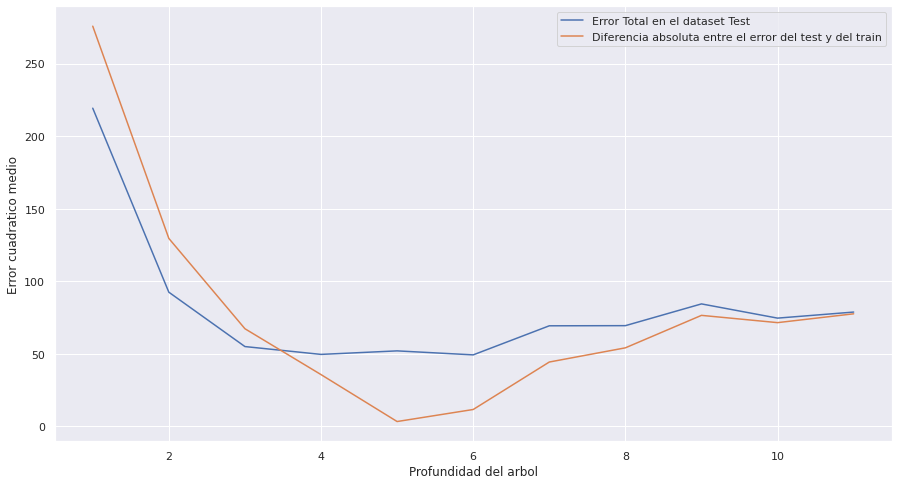

In [403]:
plt.figure(figsize = (15,8))
plt.plot(range(1,12),error_total, label = 'Error Total en el dataset Test')
plt.plot(range(1,12),diff_error_train_test, label = 'Diferencia absoluta entre el error del test y del train')
plt.legend()
plt.xlabel('Profundidad del arbol')
plt.ylabel('Error cuadratico medio')

Podemos notar que el modelo tiene un error menor en una profundidad de 5 y la diferencia entre el error en test y train es mínima en la profundidad de 5..

In [404]:
modelo = modelo_optimo[7]

### Prueba de nuestro modelo

Text(0, 0.5, 'Total de casos de dengue')

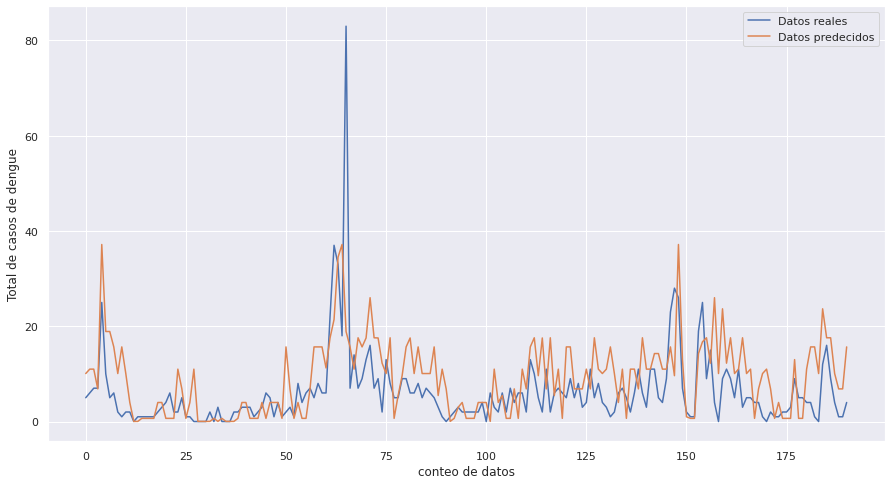

In [405]:
plt.figure(figsize = (15,8))
plt.plot(range(len(X_test)),
         y_test,
         label='Datos reales');
plt.plot(range(len(X_test)),
         modelo.predict(X_test),
         label='Datos predecidos');
plt.legend()
plt.xlabel('conteo de datos')
plt.ylabel('Total de casos de dengue')

Podemos ver que nuestro modelo si bien intenta seguir las tendencias es bastante ineficiente para lograr predecir correctamente, por lo tanto vamos a graficar la diferencia entre las predicciones y las reales

Text(0, 0.5, 'Diferencia en el total de casos de dengue')

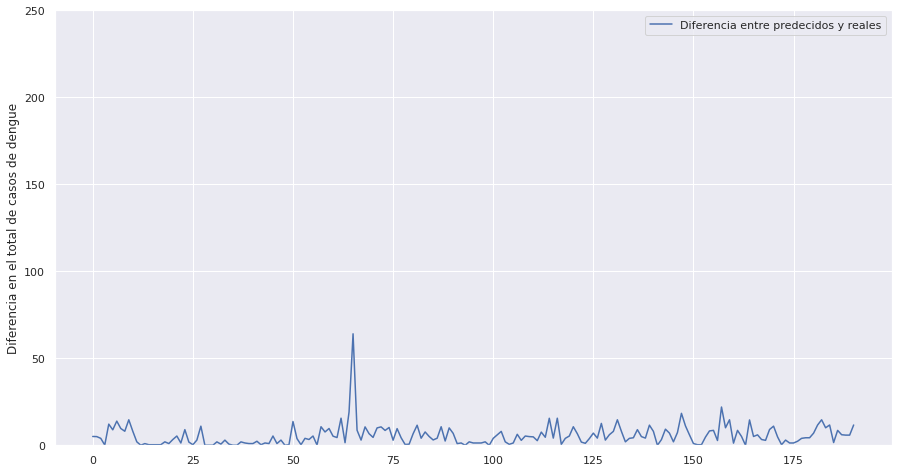

In [406]:
plt.figure(figsize = (15,8))
plt.ylim(0,250)
plt.plot(range(len(X_test)),
         abs(y_test-modelo.predict(X_test)),
         label='Diferencia entre predecidos y reales');
plt.legend()
plt.ylabel('Diferencia en el total de casos de dengue')

**CONCLUSION: SEGÚN LA GRAFICA PUEDE EXISTIR UNA DIFERENCIA DE HASTA 150 CASOS, AL UTILIZAR ESTE MODELO PARA REALIZAR PREDICCIONES.**


## KNN Regressor

**Bloque de importacion**

In [407]:
from sklearn.neighbors import KNeighborsRegressor

**Separacion en muestra de entrenamiento y testeo de los datos**

In [408]:
train_x=X[:500]
train_y=y[:500]

In [409]:
test=np.array(X.iloc[504])
test1=test.reshape(1,-1)

In [410]:
data_con_lags.iloc[500:] 

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,...,ndvi_sw_lag_1,ndvi_sw_lag_2,ndvi_sw_lag_3,ndvi_sw_lag_4,ndvi_sw_lag_5,ndvi_sw_lag_6,ndvi_sw_lag_7,ndvi_sw_lag_8,"city_Iquito, PE","city_San Juan, PR"
week_start_date,,,,,,,,,,,,,,,,,,,,,
2003-03-05,-0.206350,-0.141000,0.322186,0.299829,0.00,298.735714,298.992857,293.475714,300.7,296.9,...,0.156117,0.158486,0.222500,0.174671,0.101029,0.156571,0.226629,0.182483,0,1
2003-03-12,0.025350,0.048100,0.101843,0.136529,0.00,299.004286,299.271429,294.108571,300.9,297.1,...,0.299829,0.156117,0.158486,0.222500,0.174671,0.101029,0.156571,0.226629,0,1
2003-03-19,-0.052033,0.014220,0.155643,0.182271,0.00,298.881429,299.057143,293.484286,300.8,297.4,...,0.136529,0.299829,0.156117,0.158486,0.222500,0.174671,0.101029,0.156571,0,1
2003-03-26,-0.116900,-0.091575,0.152729,0.186771,0.00,298.752857,299.035714,293.801429,301.6,296.3,...,0.182271,0.136529,0.299829,0.156117,0.158486,0.222500,0.174671,0.101029,0,1
2003-04-02,0.092500,-0.050850,0.129800,0.121429,0.00,298.900000,299.042857,294.331429,301.9,296.8,...,0.186771,0.182271,0.136529,0.299829,0.156117,0.158486,0.222500,0.174671,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-03-26,0.266286,0.301233,0.296000,0.295743,51.29,299.004286,300.300000,297.555714,307.9,294.6,...,0.341643,0.394800,0.142767,0.333314,0.266671,0.238871,0.139343,0.261286,1,0
2010-04-02,0.141433,0.204729,0.250971,0.145243,49.80,299.002857,300.714286,296.568571,309.1,294.2,...,0.295743,0.341643,0.394800,0.142767,0.333314,0.266671,0.238871,0.139343,1,0
2010-06-11,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,297.592857,295.501429,305.5,292.4,...,0.225657,0.292514,0.244500,0.145600,0.340286,0.307943,0.244400,0.135886,1,0


**Instancia y ajuste**

In [411]:
neigh = KNeighborsRegressor(n_neighbors=10)
neigh.fit(train_x, train_y)

KNeighborsRegressor(n_neighbors=10)

**Prediccion del modelo**

In [412]:
neigh.predict(test1)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning:

X does not have valid feature names, but KNeighborsRegressor was fitted with feature names



array([7.8])

In [413]:
y_pred_knn=neigh.predict(test1)
y_true=np.array([y.iloc[504]])

print('Mean Absolute Error:', metrics.mean_absolute_error(y_true, y_pred_knn))
print('Mean Squared Error:', metrics.mean_squared_error(y_true, y_pred_knn))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_true, y_pred_knn)))

Mean Absolute Error: 4.8
Mean Squared Error: 23.04
Root Mean Squared Error: 4.8


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning:

X does not have valid feature names, but KNeighborsRegressor was fitted with feature names



In [414]:
print("Esto nos dice que la diferencia promedio entre el valor real de los datos y el valor predicho por el modelo es", metrics.mean_absolute_error(y_true, y_pred_knn))

Esto nos dice que la diferencia promedio entre el valor real de los datos y el valor predicho por el modelo es 4.8


## Random Forest

**Bloque de importacion**

In [415]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

**Separamos en set de entrenamiento y testeo**


In [416]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, shuffle = False)

**Instanciamos el modelo y lo ajustamos**

In [417]:
random_regressor = RandomForestRegressor(n_estimators=100, random_state = 0)
random_regressor.fit(X_train, y_train)

"""
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 200, num = 2)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               #'max_features': max_features,
               #'max_depth': max_depth,
               #'min_samples_split': min_samples_split,
               #'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

rf_random = RandomizedSearchCV(estimator = random_regressor, param_distributions = random_grid, n_iter = 5, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train)

print(rf_random.best_params_)
"""

"\n# Number of trees in random forest\nn_estimators = [int(x) for x in np.linspace(start = 100, stop = 200, num = 2)]\n# Number of features to consider at every split\nmax_features = ['auto', 'sqrt']\n# Maximum number of levels in tree\nmax_depth = [int(x) for x in np.linspace(10, 110, num = 11)]\nmax_depth.append(None)\n# Minimum number of samples required to split a node\nmin_samples_split = [2, 5, 10]\n# Minimum number of samples required at each leaf node\nmin_samples_leaf = [1, 2, 4]\n# Method of selecting samples for training each tree\nbootstrap = [True, False]\n\n# Create the random grid\nrandom_grid = {'n_estimators': n_estimators,\n               #'max_features': max_features,\n               #'max_depth': max_depth,\n               #'min_samples_split': min_samples_split,\n               #'min_samples_leaf': min_samples_leaf,\n               'bootstrap': bootstrap}\n\nrf_random = RandomizedSearchCV(estimator = random_regressor, param_distributions = random_grid, n_iter = 5, 

In [418]:
y_test_pred = random_regressor.predict(X_test)

**Evaluamos el modelo**

In [419]:
evaluation_random=pd.DataFrame({'Actual':y_test, 'Predicted':y_test_pred})
evaluation_random

,Actual,Predicted
week_start_date,,
2002-07-23,5,8.81
2002-07-30,6,9.94
2002-08-06,7,9.24
2002-08-13,7,8.15
2002-10-22,25,31.12
...,...,...
2010-03-26,9,18.89
2010-04-02,4,11.38
2010-06-11,1,7.94


In [420]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_test_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_test_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))

Mean Absolute Error: 4.65303664921466
Mean Squared Error: 51.126777486911
Root Mean Squared Error: 7.150299118702028


In [421]:
print("Esto nos dice que la diferencia promedio entre el valor real de los datos y el valor predicho por el modelo es", metrics.mean_absolute_error(y_test, y_test_pred))

Esto nos dice que la diferencia promedio entre el valor real de los datos y el valor predicho por el modelo es 4.65303664921466


Text(0, 0.5, 'Total de casos de dengue')

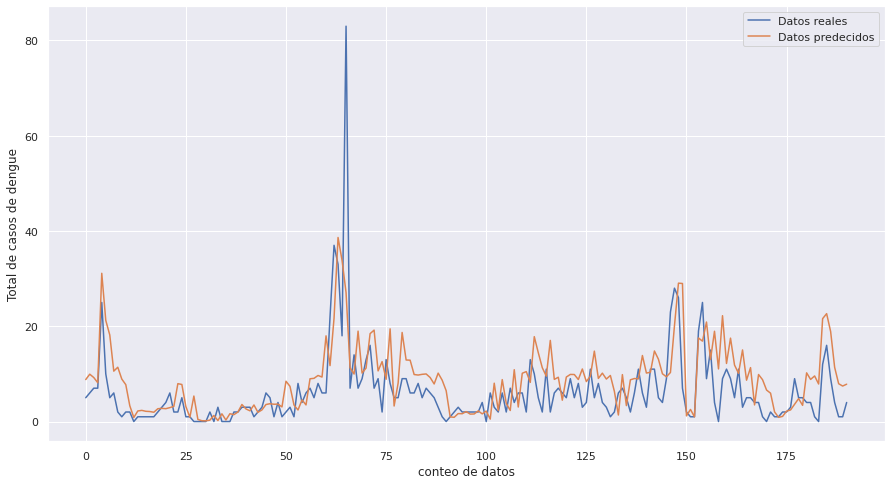

In [422]:
plt.figure(figsize = (15,8))
plt.plot(range(len(X_test)),
         y_test,
         label='Datos reales');
plt.plot(range(len(X_test)),
         random_regressor.predict(X_test),
         label='Datos predecidos');
plt.legend()
plt.xlabel('conteo de datos')
plt.ylabel('Total de casos de dengue')

## Regresión lineal

**Bloque de importación**

In [187]:
import statsmodels.api as sm

In [188]:
X_train, X_test, y_train, y_test = train_test_split(X,y,shuffle = False);

In [189]:
# Adding a constant to get an intercept
X_sm_train = sm.add_constant(X_train);
X_sm_test = sm.add_constant(X_test);

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



In [190]:
# Fitting the resgression line using 'OLS'
lr1 = sm.OLS(y_train, X_sm_train).fit()

# Printing the parameters
lr1.params

const               -1721.326781
ndvi_ne               -39.290775
ndvi_nw                53.073495
ndvi_se                -6.408683
ndvi_sw               -11.086660
                        ...     
ndvi_sw_lag_6          57.807436
ndvi_sw_lag_7          62.309152
ndvi_sw_lag_8          67.221066
city_Iquito, PE      -859.907970
city_San Juan, PR    -861.418811
Length: 103, dtype: float64

In [191]:
lr1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            total_cases   R-squared:                       0.310
Model:                            OLS   Adj. R-squared:                  0.199
Method:                 Least Squares   F-statistic:                     2.791
Date:                Tue, 12 Jul 2022   Prob (F-statistic):           1.97e-14
Time:                        20:52:00   Log-Likelihood:                -3452.6
No. Observations:                 716   AIC:                             7105.
Df Residuals:                     616   BIC:                             7563.
Df Model:                          99                                         
Covariance Type:            nonrobust                                         
===============================================================================================================
                                                  coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------
const                                       -1721.3268    954.473     -1.803      0.072   -3595.742     153.088
ndvi_ne                                       -39.2908     19.236     -2.043      0.042     -77.066      -1.515
ndvi_nw                                        53.0735     23.775      2.232      0.026       6.384      99.763
ndvi_se                                        -6.4087     42.110     -0.152      0.879     -89.104      76.287
ndvi_sw                                       -11.0867     42.892     -0.258      0.796     -95.320      73.146
precipitation_amt_mm                           -0.0240      0.020     -1.177      0.240      -0.064       0.016
reanalysis_air_temp_k                          -0.8406     66.949     -0.013      0.990    -132.317     130.636
reanalysis_avg_temp_k                         -38.1567     17.042     -2.239      0.026     -71.624      -4.689
reanalysis_dew_point_temp_k                    33.0392     65.797      0.502      0.616     -96.174     162.252
reanalysis_max_air_temp_k                      14.5511      4.090      3.558      0.000       6.520      22.583
reanalysis_min_air_temp_k                       2.4269      4.291      0.566      0.572      -6.001      10.855
reanalysis_precip_amt_kg_per_m2                 0.1037      0.069      1.500      0.134      -0.032       0.240
reanalysis_relative_humidity_percent           -3.8719      6.961     -0.556      0.578     -17.543       9.799
reanalysis_sat_precip_amt_mm                   -0.0240      0.020     -1.177      0.240      -0.064       0.016
reanalysis_specific_humidity_g_per_kg          -3.8719      6.961     -0.556      0.578     -17.543       9.799
reanalysis_tdtr_k                              -1.4960      4.537     -0.330      0.742     -10.406       7.414
station_avg_temp_c                             -0.4460      5.145     -0.087      0.931     -10.550       9.658
station_diur_temp_rng_c                         0.2825      2.776      0.102      0.919      -5.169       5.734
station_max_temp_c                             -0.9125      2.318     -0.394      0.694      -5.465       3.640
station_min_temp_c                             -0.4500      2.653     -0.170      0.865      -5.659       4.759
station_precip_mm                              -0.0216      0.060     -0.363      0.717      -0.139       0.095
station_precip_mm_lag_1                        -0.0089      0.057     -0.155      0.877      -0.122       0.104
station_precip_mm_lag_2                        -0.0288      0.058     -0.499      0.618      -0.142       0.084
station_precip_mm_lag_3                        -0.0255      0.057     -0.444      0.657      -0.138       0.087
station_precip_mm_lag_4                        -0.0053     

### Ingenieria de caracteristicas solo para el caso de regresión

Crearemos nuevas columnas de caracteristicas con el fin de tener mas parámetros para alimentar el modelo. En principio el propósito de esta sección será el de lograr para una misma carácteristica agrandar las formas posibles que tengan sus datos. Por ejemplo para una caracteristica normal el modelo creará la siguiente forma:

\begin{equation}
Y = \alpha x
\end{equation}

Sin embargo para enriquecer el modelo agregaremos columnas al cuadrado y con su raiz cuadrada con lo cual tendremos:

\begin{equation}
Y = \alpha x^2 + \beta x + \gamma \sqrt{x}
\end{equation}

Este modelo podría llegar a captar sutilezas que se perderian en modelo con columnas lineales

In [192]:
data_con_lags.head()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,...,ndvi_sw_lag_1,ndvi_sw_lag_2,ndvi_sw_lag_3,ndvi_sw_lag_4,ndvi_sw_lag_5,ndvi_sw_lag_6,ndvi_sw_lag_7,ndvi_sw_lag_8,"city_Iquito, PE","city_San Juan, PR"
week_start_date,,,,,,,,,,,,,,,,,,,,,
1990-07-02,0.127119,0.12155,0.160683,0.202567,14.41,300.154286,300.278571,296.651429,302.3,298.7,...,0.123600,0.133029,0.210271,0.181743,0.247340,0.235886,0.170843,0.155486,0,1
1990-07-09,0.192875,0.08235,0.191943,0.152929,22.27,299.512857,299.592857,296.041429,301.8,298.0,...,0.202567,0.123600,0.133029,0.210271,0.181743,0.247340,0.235886,0.170843,0,1
1990-07-16,0.291600,0.21180,0.301200,0.280667,59.17,299.667143,299.750000,296.334286,302.0,297.3,...,0.152929,0.202567,0.123600,0.133029,0.210271,0.181743,0.247340,0.235886,0,1
1990-07-23,0.150567,0.17170,0.226900,0.214557,16.48,299.558571,299.635714,295.960000,301.8,297.1,...,0.280667,0.152929,0.202567,0.123600,0.133029,0.210271,0.181743,0.247340,0,1
1990-07-30,0.250611,0.24715,0.379700,0.381357,32.66,299.862857,299.950000,296.172857,303.0,298.3,...,0.214557,0.280667,0.152929,0.202567,0.123600,0.133029,0.210271,0.181743,0,1


Primero fabricamos las columnas al cuadrado

In [193]:
tipos_de_datos = list(set([data_con_lags[i].dtype for i in data_con_lags.columns]))
print('Los tipos de datos que tenemos en el dataset son: ',tipos_de_datos)

Los tipos de datos que tenemos en el dataset son:  [dtype('float64'), dtype('uint8'), dtype('int64')]


Aprovechando que ya hemos convertido a todos en datos del tipo numérico podremos realizar las transformaciones correspondientes. Los unicos datos que sacaremos de los datos serán aquellos correspondientes a fechas y datos correspondientes a dummies hechos anterioremente (los 'uint8')

In [194]:
data_feature_engineering = data_con_lags.copy();
for i in data_feature_engineering.columns:
  if data_feature_engineering[i].dtype != tipos_de_datos[0] and i not in ['anio','mes','dia','weekofyear','total_cases']:
    # Elevamos al cuadrado la columna.
    data_feature_engineering[i+'^2']       = data_feature_engineering[i]**2;
    # Aplicamos raiz cuadrada a la columna.
    data_feature_engineering[i+'^0.5'] = np.sqrt(data_feature_engineering[i]);

In [195]:
data_feature_engineering.head()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,...,ndvi_sw_lag_5,ndvi_sw_lag_6,ndvi_sw_lag_7,ndvi_sw_lag_8,"city_Iquito, PE","city_San Juan, PR","city_Iquito, PE^2","city_Iquito, PE^0.5","city_San Juan, PR^2","city_San Juan, PR^0.5"
week_start_date,,,,,,,,,,,,,,,,,,,,,
1990-07-02,0.127119,0.12155,0.160683,0.202567,14.41,300.154286,300.278571,296.651429,302.3,298.7,...,0.247340,0.235886,0.170843,0.155486,0,1,0,0.0,1,1.0
1990-07-09,0.192875,0.08235,0.191943,0.152929,22.27,299.512857,299.592857,296.041429,301.8,298.0,...,0.181743,0.247340,0.235886,0.170843,0,1,0,0.0,1,1.0
1990-07-16,0.291600,0.21180,0.301200,0.280667,59.17,299.667143,299.750000,296.334286,302.0,297.3,...,0.210271,0.181743,0.247340,0.235886,0,1,0,0.0,1,1.0
1990-07-23,0.150567,0.17170,0.226900,0.214557,16.48,299.558571,299.635714,295.960000,301.8,297.1,...,0.133029,0.210271,0.181743,0.247340,0,1,0,0.0,1,1.0
1990-07-30,0.250611,0.24715,0.379700,0.381357,32.66,299.862857,299.950000,296.172857,303.0,298.3,...,0.123600,0.133029,0.210271,0.181743,0,1,0,0.0,1,1.0


### Entrenamiento del modelo

Crearemos el modelo regresión lineal

Para el modelo es necesario no tener nulls por lo tanto los eliminamos

In [196]:
data_feature_engineering_notnulls = data_feature_engineering.dropna();

Separamos en train y test

In [197]:
numero_aleatorio = np.random.randint(999);
X_train, X_test, y_train, y_test = train_test_split(data_feature_engineering_notnulls.drop(columns = 'total_cases'),data_feature_engineering_notnulls['total_cases'],random_state = numero_aleatorio);

Agregamos la constante necesaria para el modelo

In [198]:
# Adding a constant to get an intercept
X_sm_train = sm.add_constant(X_train);
X_sm_test  = sm.add_constant(X_test);

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



Instanciamos el modelo

In [199]:
# Fitting the resgression line using 'OLS'
lr = sm.OLS(y_train, X_sm_train).fit()

# Printing the parameters
lr.params

const                   -286.183395
ndvi_ne                  -32.272552
ndvi_nw                   32.220225
ndvi_se                   19.806890
ndvi_sw                  -14.866614
                            ...    
city_San Juan, PR       -141.482126
city_Iquito, PE^2       -144.701269
city_Iquito, PE^0.5     -144.701269
city_San Juan, PR^2     -141.482126
city_San Juan, PR^0.5   -141.482126
Length: 107, dtype: float64

In [200]:
# Performing a summary to list out all the different parameters of the regression line fitted
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            total_cases   R-squared:                       0.338
Model:                            OLS   Adj. R-squared:                  0.231
Method:                 Least Squares   F-statistic:                     3.171
Date:                Tue, 12 Jul 2022   Prob (F-statistic):           3.62e-18
Time:                        20:52:00   Log-Likelihood:                -3352.0
No. Observations:                 716   AIC:                             6904.
Df Residuals:                     616   BIC:                             7361.
Df Model:                          99                                         
Covariance Type:            nonrobust                                         
===============================================================================================================
                                                  coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------
const                                        -286.1834    301.834     -0.948      0.343    -878.932     306.566
ndvi_ne                                       -32.2726     17.028     -1.895      0.059     -65.712       1.167
ndvi_nw                                        32.2202     20.510      1.571      0.117      -8.057      72.497
ndvi_se                                        19.8069     31.818      0.623      0.534     -42.677      82.291
ndvi_sw                                       -14.8666     31.566     -0.471      0.638     -76.856      47.123
precipitation_amt_mm                           -0.0097      0.018     -0.543      0.587      -0.045       0.025
reanalysis_air_temp_k                          -4.3921     21.358     -0.206      0.837     -46.335      37.551
reanalysis_avg_temp_k                          -9.7704      8.656     -1.129      0.259     -26.769       7.228
reanalysis_dew_point_temp_k                    13.8899     21.087      0.659      0.510     -27.522      55.302
reanalysis_max_air_temp_k                       2.7175      1.880      1.446      0.149      -0.974       6.409
reanalysis_min_air_temp_k                       0.4029      2.565      0.157      0.875      -4.634       5.440
reanalysis_precip_amt_kg_per_m2                 0.0337      0.046      0.741      0.459      -0.056       0.123
reanalysis_relative_humidity_percent           -1.4806      2.305     -0.642      0.521      -6.008       3.047
reanalysis_sat_precip_amt_mm                   -0.0097      0.018     -0.543      0.587      -0.045       0.025
reanalysis_specific_humidity_g_per_kg          -1.4806      2.305     -0.642      0.521      -6.008       3.047
reanalysis_tdtr_k                               1.9789      2.616      0.756      0.450      -3.159       7.117
station_avg_temp_c                             -2.4163      3.437     -0.703      0.482      -9.166       4.334
station_diur_temp_rng_c                        -0.2048      2.005     -0.102      0.919      -4.142       3.733
station_max_temp_c                              1.4383      1.758      0.818      0.414      -2.015       4.891
station_min_temp_c                              1.5663      1.961      0.799      0.425      -2.284       5.417
station_precip_mm                               0.0124      0.037      0.332      0.740      -0.061       0.086
station_precip_mm_lag_1                        -0.0188      0.035     -0.536      0.592      -0.088       0.050
station_precip_mm_lag_2                         0.0145      0.034      0.431      0.667      -0.052       0.081
station_precip_mm_lag_3                         0.0308      0.033      0.937      0.349      -0.034       0.095
station_precip_mm_lag_4                         0.0003     

In [201]:
# Predicting y_value using traingn data of X
y_pred = lr.predict(X_sm_test);

print('El error del modelo será de: ',mean_squared_error(y_pred,y_test))

El error del modelo será de:  1017.4578525245257


**Observaciones:** En el caso de lr1 y lr con el agregado de variables nuevas, se observa un valor R2 y R2 ajustado entre 0.2 y 0.3, adicionalmente un valor estadistico de F bajo, indicando que el modelo es no significativo. Los valores p estadisticos en cada variable además son no significativos para rechazar la hipotesis nula, indicando que la regresion lineal como modelo no se ajusta bien a los datos. 

## XGBoost


Instalamos la libreria

In [469]:
pip install xgboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Importamos e instanciamos el modelo

In [470]:
import xgboost as xgb
"""
param = {}
param['booster'] = 'gbtree'
param['objective'] = 'binary:logistic'
param["eval_metric"] = "error"
param['eta'] = 0.3
param['gamma'] = 0
param['max_depth'] = 6
param['min_child_weight']=1
param['max_delta_step'] = 0
param['subsample']= 1
param['colsample_bytree']=1
param['silent'] = 1
param['seed'] = 0
param['base_score'] = 0.5
"""
clf_xgb = xgb.XGBRegressor(objective    = 'reg:squarederror', 
                            n_estimators = 30,
                            seed         = 123,
                            max_depth    = 50,
                            eval_metric  = "error",
                            booster      = "gbtree");
clf_xgb.fit(X_train,y_train)

XGBRegressor(eval_metric='error', max_depth=50, n_estimators=30,
             objective='reg:squarederror', seed=123)

In [471]:
y_pred = clf_xgb.predict(X_train);
mean_squared_error(y_pred,y_train)

14.364208680770608

In [472]:
y_pred = clf_xgb.predict(X_test);
mean_squared_error(y_pred,y_test)

47.961682425683094

Predecimos

In [473]:
evaluation_random=pd.DataFrame({'Actual':y_test, 'Predicted':y_pred})
evaluation_random

,Actual,Predicted
week_start_date,,
2002-07-23,5,9.872648
2002-07-30,6,8.516065
2002-08-06,7,6.707909
2002-08-13,7,7.408239
2002-10-22,25,21.397346
...,...,...
2010-03-26,9,16.119678
2010-04-02,4,10.014118
2010-06-11,1,7.905863


Graficamos

Text(0, 0.5, 'Total de casos de dengue')

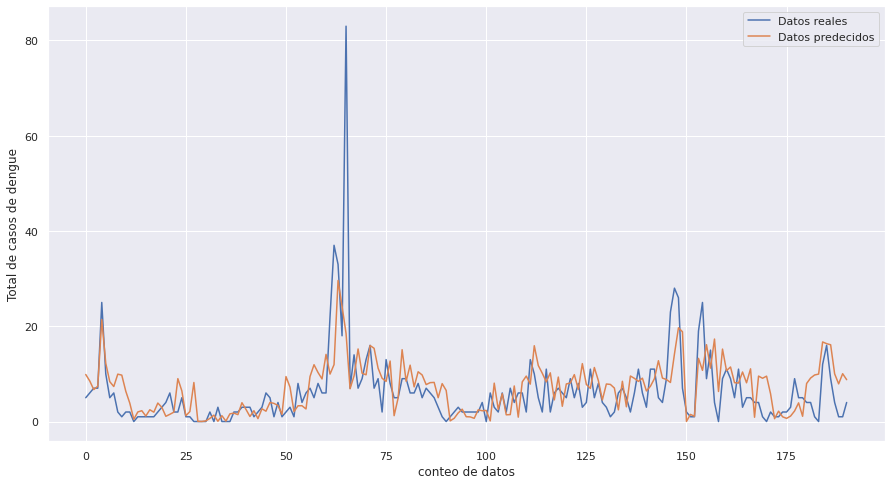

In [474]:
plt.figure(figsize = (15,8))
plt.plot(range(len(X_test)),
         y_test,
         label='Datos reales');
plt.plot(range(len(X_test)),
         y_pred,
         label='Datos predecidos');
plt.legend()
plt.xlabel('conteo de datos')
plt.ylabel('Total de casos de dengue')

## CATBOOST

Instalamos el modelo

In [ ]:
pip install catboost

Instanciamos el modelo

In [338]:
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, shuffle = False)
CBC = CatBoostRegressor(random_state=2018);

Entrenamos el modelo

In [ ]:
param_grid = {"learning_rate"    : [0.20, 0.25, 0.30 ] ,
              "max_depth"        : [10, 12, 15],
              "iterations"       : [20]}

gs = GridSearchCV(CBC, param_grid, cv=3);
gs.fit(X_train,y_train)

In [352]:
gs.best_params_

{'iterations': 20, 'learning_rate': 0.2, 'max_depth': 12}

Los mejores parámetros serán de learning rate 0,2 y max depth = 12

In [475]:
param_grid = {"learning_rate"    : [0.1,0.20] ,
              "max_depth"        : [12],
              "iterations"       : [30]}

gs = GridSearchCV(CBC, param_grid, cv=3);
gs.fit(X_train,y_train)



0:	learn: 35.7421142	total: 970ms	remaining: 28.1s
1:	learn: 34.4891434	total: 2.49s	remaining: 34.9s
2:	learn: 32.8259462	total: 4.33s	remaining: 39s
3:	learn: 31.6402758	total: 6.16s	remaining: 40s
4:	learn: 30.6618341	total: 7.72s	remaining: 38.6s
5:	learn: 29.3807041	total: 9.46s	remaining: 37.9s
6:	learn: 28.3174215	total: 11.1s	remaining: 36.5s
7:	learn: 27.1568628	total: 12.8s	remaining: 35.2s
8:	learn: 26.0707541	total: 14.7s	remaining: 34.4s
9:	learn: 24.7392419	total: 16.4s	remaining: 32.9s
10:	learn: 24.0438317	total: 18.1s	remaining: 31.2s
11:	learn: 23.1243282	total: 19.9s	remaining: 29.9s
12:	learn: 22.2421238	total: 21.8s	remaining: 28.5s
13:	learn: 21.4973954	total: 23.3s	remaining: 26.6s
14:	learn: 20.9345236	total: 24.9s	remaining: 24.9s
15:	learn: 20.1178218	total: 26.8s	remaining: 23.4s
16:	learn: 19.4083947	total: 28.5s	remaining: 21.8s
17:	learn: 18.7989802	total: 30.4s	remaining: 20.3s
18:	learn: 18.0690623	total: 33.5s	remaining: 19.4s
19:	learn: 17.5460784	tota

In [476]:
y_test_pred = gs.predict(X_test)

In [477]:
evaluation_random=pd.DataFrame({'Actual':y_test, 'Predicted':y_test_pred})
evaluation_random

,Actual,Predicted
week_start_date,,
2002-07-23,5,13.126145
2002-07-30,6,9.832630
2002-08-06,7,8.947299
2002-08-13,7,7.101193
2002-10-22,25,17.538646
...,...,...
2010-03-26,9,12.677853
2010-04-02,4,15.265190
2010-06-11,1,10.271244


In [478]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_test_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_test_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))

Mean Absolute Error: 6.619411710478062
Mean Squared Error: 77.80196137389531
Root Mean Squared Error: 8.820542011344616


Text(0, 0.5, 'Total de casos de dengue')

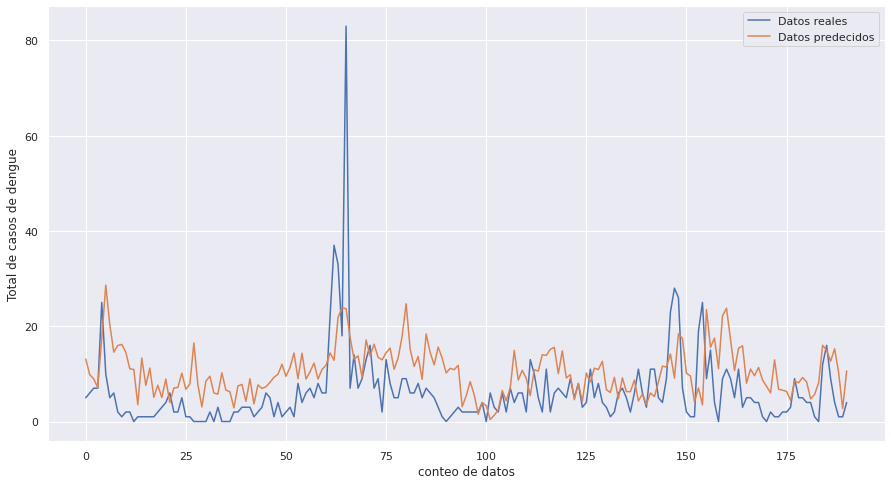

In [479]:
plt.figure(figsize = (15,8))
plt.plot(range(len(X_test)),
         y_test,
         label='Datos reales');
plt.plot(range(len(X_test)),
         gs.predict(X_test),
         label='Datos predecidos');
plt.legend()
plt.xlabel('conteo de datos')
plt.ylabel('Total de casos de dengue')

# Predicción a largo plazo con el mejor modelo

Tomaremos el algoritmo que mejor nos ha predecido y lo haremos predecir a futuro a partir de la construcción de los valores de "total_cases" que es nuestra variable de interes a predecir. 

Aquí cambia sustancialmente lo que veniamos haciendo ya que antes nos apoyabamos en datos veridicos con una semana de atraso para poder predecir. En cambio ahora serán valores nuevos predecidos sobre los cuales nos iremos apoyando a medida que comenzamos a predecir mas lejos en el futuro.

Esto traerá concecuencias muy probablemente en las cuales veremos que a medida que nos alejamos en la predicción muy al futuro, la precisión del algoritmo bajará.

Vamos a usar el modelo mas preciso que logramos entrenar el cual fue el XGBoost

Lo primero que tendremos que hacer es fabricar una función para poder crear la trazabilidad de los datos uno detras de otro

In [480]:
def multistep_predict(modelo,X_test,lags_label):
  """
  Esta función se encarga de ir prediciendo con el modelo.
  """
  # Lo iremos haciendo por filas
  largo_prueba = len(X_test);

  # Array de predecidos
  pred         = [];

  # Array de lags
  lags         = [];

  for n in range(largo_prueba):
    
    if n == 0:
      # Recortamos una fila
      fila             = X_test.iloc[n:n+1];

      # Predecimos
      valor_predicho   = random_regressor.predict(fila)[0];

      # DF de lags con motivos de debbugeo
      df_lags = fila[lags_label];

    else:
      # Tiramos las columnas anteriores
      fila             = X_test.iloc[n:n+1].drop(columns = lags_label);

      # Agregamos el lag 1 que es el nuevo predicho
      fila[lags_label[0]] = valor_predicho;

      # Agregamos los lags arreglados (desfazados o corridos a partir del lag 2)
      fila[lags_label[1:len(lags_label)]] = lags[0:len(lags)-1];

      # Predecimos
      valor_predicho   = random_regressor.predict(fila)[0];

    # Guardamos los lags en formato de lista
    lags           = list(fila[lags_label].values[0]);

    # Guardamos en el DF
    df_lags.loc[len(df_lags)] = lags;

    # Guardamos el valor predicho en la lista:
    pred.append(valor_predicho);
    
  return df_lags,pred;

Predecimos

In [ ]:
datafame,y_pred = multistep_predict(clf_xgb,
                  X_test,
                  ['total_cases_lag_1',
                   'total_cases_lag_2',
                   'total_cases_lag_3',
                   'total_cases_lag_4',
                   'total_cases_lag_5',
                   'total_cases_lag_6',
                   'total_cases_lag_7',
                   'total_cases_lag_8']
                  )

Corroboramos que esté desfazando los lags correctamente

In [482]:
datafame

,total_cases_lag_1,total_cases_lag_2,total_cases_lag_3,total_cases_lag_4,total_cases_lag_5,total_cases_lag_6,total_cases_lag_7,total_cases_lag_8
week_start_date,,,,,,,,
2002-07-23 00:00:00,4.00,7.00,7.00,3.00,11.00,11.00,2.00,13.00
1,4.00,7.00,7.00,3.00,11.00,11.00,2.00,13.00
2,8.81,4.00,7.00,7.00,3.00,11.00,11.00,2.00
3,66.32,8.81,4.00,7.00,7.00,3.00,11.00,11.00
4,38.44,66.32,8.81,4.00,7.00,7.00,3.00,11.00
...,...,...,...,...,...,...,...,...
187,42.38,21.31,64.34,41.89,56.98,24.52,41.51,114.47
188,20.57,42.38,21.31,64.34,41.89,56.98,24.52,41.51
189,25.71,20.57,42.38,21.31,64.34,41.89,56.98,24.52


Evaluamos la predicción

In [483]:
evaluation_random=pd.DataFrame({'Actual':y_test, 'Predicted':y_pred})
evaluation_random

,Actual,Predicted
week_start_date,,
2002-07-23,5,8.81
2002-07-30,6,66.32
2002-08-06,7,38.44
2002-08-13,7,10.93
2002-10-22,25,11.29
...,...,...
2010-03-26,9,20.57
2010-04-02,4,25.71
2010-06-11,1,39.41


In [484]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 74.74146596858638
Mean Squared Error: 9253.216394764399
Root Mean Squared Error: 96.19364009519755


Text(0, 0.5, 'Total de casos de dengue')

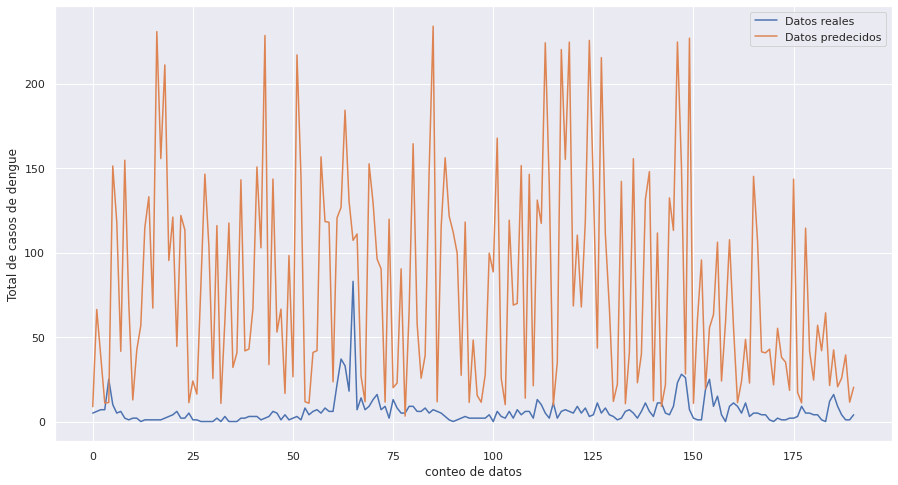

In [485]:
plt.figure(figsize = (15,8))
plt.plot(range(len(X_test)),
         y_test,
         label='Datos reales');
plt.plot(range(len(X_test)),
         y_pred,
         label='Datos predecidos');
plt.legend()
plt.xlabel('conteo de datos')
plt.ylabel('Total de casos de dengue')

# Conclusión

Como conclusión podemos ver que de los modelos probados el que mejor ha podido predecir ha sido el algoritmo XGBoost, esto es tomando bajo consideración con una predicción de una semana a otra. Para tiempos posteriores es posible que el algoritmo desvíe sus mediciones, sin embargo bajo estas consideraciones podemos decir que nuestra predicción es altamente precisa.

Esta caracteristica antes mencionada de una precisión mayor a tiempos mas cercanos es típica de sistemas caoticos como lo pueden ser el clima por ejemplo. Estos sistemas bajo minimos cambios en sus condiciones iniciales conducen a grandes diferencias en sus resultados finales.